In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import numpy as np
import nltk.classify.util
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

C:\Users\vinaysha\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df=pd.read_csv("C:\Vinay\Projects_for_Github\Hotel Reviews\hotel_reviews.csv")

In [3]:
df.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,...,reviews.dateSeen,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sourceURLs,websites
0,AWE2FvX5RxPSIh2RscTK,2018-01-18T18:43:12Z,2019-05-20T23:55:47Z,5620 Calle Real,"Hotels,Hotels and motels,Hotel and motel mgmt....",Accommodation & Food Services,Goleta,US,us/ca/goleta/5620callereal/-1127060008,34.44178,...,2018-01-03T00:00:00Z,3,https://www.tripadvisor.com/Hotel_Review-g3243...,"This hotel was nice and quiet. Did not know, t...",Best Western Plus Hotel,San Jose,UnitedStates,tatsurok2018,https://www.tripadvisor.com/Hotel_Review-g3243...,https://www.bestwestern.com/en_US/book/hotel-r...
1,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,2016-10-09T00:00:00Z,4,https://www.tripadvisor.com/Hotel_Review-g3217...,We stayed in the king suite with the separatio...,Clean rooms at solid rates in the heart of Carmel,San Francisco,CA,STEPHEN N,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com
2,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,2016-10-09T00:00:00Z,3,https://www.tripadvisor.com/Hotel_Review-g3217...,"Parking was horrible, somebody ran into my ren...",Business,Prescott Valley,AZ,15Deborah,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com
3,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,2016-10-31T00:00:00Z,5,https://www.tripadvisor.com/Hotel_Review-g3217...,Not cheap but excellent location. Price is som...,Very good,Guaynabo,PR,Wilfredo M,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com
4,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,"2016-10-09T00:00:00Z,2016-03-27T00:00:00Z",2,https://www.tripadvisor.com/Hotel_Review-g3217...,If you get the room that they advertised on th...,Low chance to come back here,Reno,NV,Luc D,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com


In [4]:
df['city'].value_counts()

San Diego        1189
San Francisco     808
New Orleans       798
Atlanta           762
Orlando           734
                 ... 
Albany              1
Rockville           1
Ripon               1
Ventura             1
Mercer              1
Name: city, Length: 842, dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    10000 non-null  object 
 1   dateAdded             10000 non-null  object 
 2   dateUpdated           10000 non-null  object 
 3   address               10000 non-null  object 
 4   categories            10000 non-null  object 
 5   primaryCategories     10000 non-null  object 
 6   city                  10000 non-null  object 
 7   country               10000 non-null  object 
 8   keys                  10000 non-null  object 
 9   latitude              10000 non-null  float64
 10  longitude             10000 non-null  float64
 11  name                  10000 non-null  object 
 12  postalCode            10000 non-null  object 
 13  province              10000 non-null  object 
 14  reviews.date          10000 non-null  object 
 15  reviews.dateAdded   

In [6]:
df_map = folium.Map(
    location = [29.949125, -90.069748],
    tiles = 'OpenStreetMap',
    zoom_start = 11
)

df_map

In [7]:
for i in range(len(df)):
    
    folium.CircleMarker(
        location = [df['latitude'].iloc[i], df['longitude'].iloc[i]],
        radius = 3,
        popup = df['name'].iloc[i],
    ).add_to(df_map) 
    
df_map

In [8]:
df['name'].value_counts() 

Hyatt House Seattle/Downtown                          209
Hotel Emma                                            183
French Market Inn                                     144
St. James Hotel, an Ascend Hotel Collection Member    136
Grand Hyatt Seattle                                   135
                                                     ... 
Days Inn-Maui Oceanfront                                1
Days Inn-henryetta                                      1
Motel 6 Oakland Airport                                 1
Best Western Santa Fe                                   1
Days Inn Hotel Spencer IA                               1
Name: name, Length: 1311, dtype: int64

In [9]:
df['name'].replace({'LA Hacienda Motel': 'LA Hacienda Hotel'}, inplace=True)

In [10]:
df.isnull().sum()

id                          0
dateAdded                   0
dateUpdated                 0
address                     0
categories                  0
primaryCategories           0
city                        0
country                     0
keys                        0
latitude                    0
longitude                   0
name                        0
postalCode                  0
province                    0
reviews.date                0
reviews.dateAdded       10000
reviews.dateSeen            0
reviews.rating              0
reviews.sourceURLs          0
reviews.text                0
reviews.title               1
reviews.userCity            0
reviews.userProvince        2
reviews.username            0
sourceURLs                  0
websites                    0
dtype: int64

In [11]:
df.shape

(10000, 26)

In [12]:
df.head()

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,...,reviews.dateSeen,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sourceURLs,websites
0,AWE2FvX5RxPSIh2RscTK,2018-01-18T18:43:12Z,2019-05-20T23:55:47Z,5620 Calle Real,"Hotels,Hotels and motels,Hotel and motel mgmt....",Accommodation & Food Services,Goleta,US,us/ca/goleta/5620callereal/-1127060008,34.44178,...,2018-01-03T00:00:00Z,3,https://www.tripadvisor.com/Hotel_Review-g3243...,"This hotel was nice and quiet. Did not know, t...",Best Western Plus Hotel,San Jose,UnitedStates,tatsurok2018,https://www.tripadvisor.com/Hotel_Review-g3243...,https://www.bestwestern.com/en_US/book/hotel-r...
1,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,2016-10-09T00:00:00Z,4,https://www.tripadvisor.com/Hotel_Review-g3217...,We stayed in the king suite with the separatio...,Clean rooms at solid rates in the heart of Carmel,San Francisco,CA,STEPHEN N,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com
2,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,2016-10-09T00:00:00Z,3,https://www.tripadvisor.com/Hotel_Review-g3217...,"Parking was horrible, somebody ran into my ren...",Business,Prescott Valley,AZ,15Deborah,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com
3,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,2016-10-31T00:00:00Z,5,https://www.tripadvisor.com/Hotel_Review-g3217...,Not cheap but excellent location. Price is som...,Very good,Guaynabo,PR,Wilfredo M,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com
4,AVwcj_OhkufWRAb5wi9T,2016-11-06T20:21:05Z,2019-05-20T23:31:56Z,5th And San Carlos PO Box 3574,"Hotels,Lodging,Hotel",Accommodation & Food Services,Carmel by the Sea,US,us/ca/carmelbythesea/5thandsancarlospobox3574/...,36.55722,...,"2016-10-09T00:00:00Z,2016-03-27T00:00:00Z",2,https://www.tripadvisor.com/Hotel_Review-g3217...,If you get the room that they advertised on th...,Low chance to come back here,Reno,NV,Luc D,http://www.tripadvisor.com/Hotel_Review-g32172...,http://www.bestwestern.com


In [13]:
new_df=df[['name','city','reviews.rating','reviews.title','reviews.text']]

In [14]:
new_df.isnull().sum()

name              0
city              0
reviews.rating    0
reviews.title     1
reviews.text      0
dtype: int64

In [15]:
null_data = new_df[new_df.isnull().any(axis=1)]
null_data

,name,city,reviews.rating,reviews.title,reviews.text
4768,Aloft Atlanta Downtown,Atlanta,5,NaN,Staffs and service were excellent. I will defi...


In [16]:
new_df.dropna(subset = ['reviews.title'], inplace=True)

In [17]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9999 entries, 0 to 9999
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   name            9999 non-null   object
 1   city            9999 non-null   object
 2   reviews.rating  9999 non-null   int64 
 3   reviews.title   9999 non-null   object
 4   reviews.text    9999 non-null   object
dtypes: int64(1), object(4)
memory usage: 468.7+ KB


In [18]:
new_df[new_df['reviews.rating'] > 3]

,name,city,reviews.rating,reviews.title,reviews.text
1,Best Western Carmel's Town House Lodge,Carmel by the Sea,4,Clean rooms at solid rates in the heart of Carmel,We stayed in the king suite with the separatio...
3,Best Western Carmel's Town House Lodge,Carmel by the Sea,5,Very good,Not cheap but excellent location. Price is som...
5,21c Museum Hotel Lexington,Lexington,4,Loved staying here,"This is such a fun, lovely hotel. The attentio..."
8,Microtel Inn Suites By Wyndham Lexington,Lexington,5,Location Location Location,MoreMore
10,Hampton Inn Lexington Medical Center,Lexington,5,Beautiful hotel,This is a new Hampton Inn and is well decorate...
...,...,...,...,...,...
9995,Hampton Inn Hampton-newport News,Hampton,4,Very accommodating and friendly staff!,My friends and I took a trip to Hampton for th...
9996,Hampton Inn Hampton-newport News,Hampton,5,"comfortable, friendly, clean, professional","from check in to departure, staff is friendly,..."
9997,Hampton Inn Hampton-newport News,Hampton,5,Great location,This Hampton is located on a quiet street acro...
9998,Roseberry's Inn,Hunter,5,Great Atmosphere!,Awesome wings (my favorite was garlic parmesan...


In [19]:
new_df["sentiment"] = new_df["reviews.rating"]>=4

In [20]:
new_df["sentiment"] = new_df["sentiment"].replace([True , False] , ["positive" , "negative"])

In [21]:
new_df=new_df[new_df['reviews.rating']!=3]
new_df.head()

,name,city,reviews.rating,reviews.title,reviews.text,sentiment
1,Best Western Carmel's Town House Lodge,Carmel by the Sea,4,Clean rooms at solid rates in the heart of Carmel,We stayed in the king suite with the separatio...,positive
3,Best Western Carmel's Town House Lodge,Carmel by the Sea,5,Very good,Not cheap but excellent location. Price is som...,positive
4,Best Western Carmel's Town House Lodge,Carmel by the Sea,2,Low chance to come back here,If you get the room that they advertised on th...,negative
5,21c Museum Hotel Lexington,Lexington,4,Loved staying here,"This is such a fun, lovely hotel. The attentio...",positive
6,21c Museum Hotel Lexington,Lexington,1,Does not live up to its reputation,We recently stayed at this hotel on a trip to ...,negative


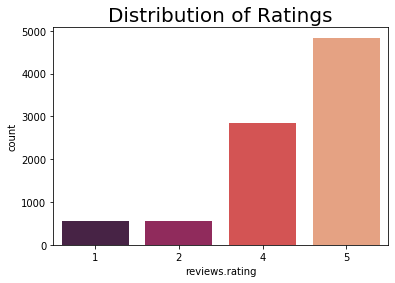

In [22]:
sns.countplot(new_df['reviews.rating'], palette = 'rocket')
plt.title('Distribution of Ratings', fontsize = 20)
plt.show()

In [23]:
new_df['name'].value_counts().head(10)

Hyatt House Seattle/Downtown                          193
Hotel Emma                                            180
French Market Inn                                     136
Drury Inn & Suites New Orleans                        129
Grand Hyatt Seattle                                   127
St. James Hotel, an Ascend Hotel Collection Member    121
Galleria Park Hotel                                   119
Luana Waikiki Hotel & Suites                          115
Homewood Suites by Hilton Lake Buena Vista-Orlando    110
Mandarin Oriental, Miami                              101
Name: name, dtype: int64

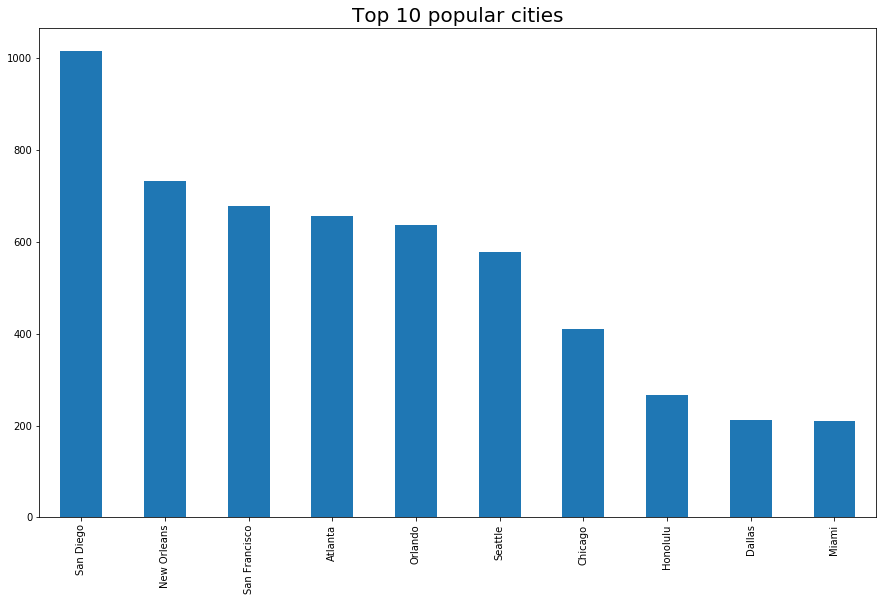

In [24]:
new_df['city'].value_counts().head(10).plot.bar(figsize = (15, 9))
plt.title('Top 10 popular cities', fontsize = 20, fontweight = 30)
plt.show()

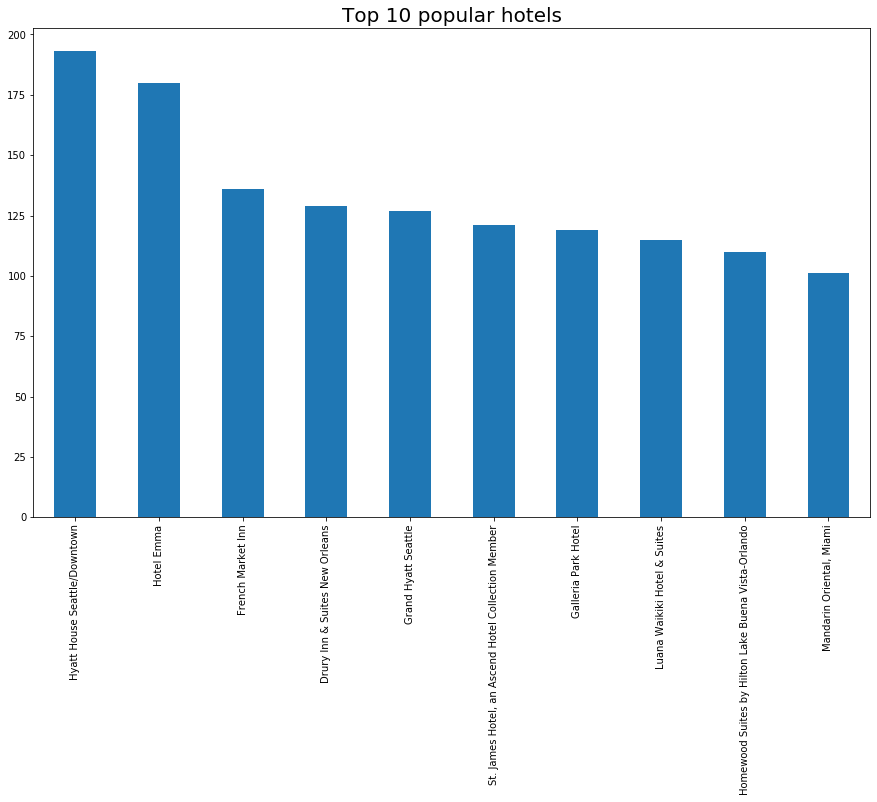

In [25]:
new_df['name'].value_counts().head(10).plot.bar(figsize = (15, 9))
plt.title('Top 10 popular hotels', fontsize = 20, fontweight = 30)
plt.show()

**Cleaning text**

In [26]:
import nltk.classify.util
from nltk.classify import NaiveBayesClassifier
import numpy as np
import re
import string
import nltk

cleanup_re = re.compile('[^a-z]+')
def cleanup(sentence):
    sentence = str(sentence)
    sentence = sentence.lower()
    sentence = cleanup_re.sub(' ', sentence).strip()
    return sentence

new_df["Summary_Clean"] = new_df["reviews.text"].apply(cleanup)
new_df["Summary_Clean"]

1       we stayed in the king suite with the separatio...
3       not cheap but excellent location price is some...
4       if you get the room that they advertised on th...
5       this is such a fun lovely hotel the attention ...
6       we recently stayed at this hotel on a trip to ...
                              ...                        
9995    my friends and i took a trip to hampton for th...
9996    from check in to departure staff is friendly p...
9997    this hampton is located on a quiet street acro...
9998    awesome wings my favorite was garlic parmesan ...
9999    clean facility just off freeway staff friendly...
Name: Summary_Clean, Length: 8809, dtype: object

**Splitting Train and Test Data**

In [27]:
split = new_df[["Summary_Clean" , "sentiment"]]
train=split.sample(frac=0.8,random_state=0)
test=split.drop(train.index)

**Now we are bulding Countvector and Tfidf vector for train , test data**

In [28]:
from wordcloud import STOPWORDS

from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
stopwords = set(STOPWORDS)
stopwords.remove("not")

count_vect = CountVectorizer(stop_words=stopwords , ngram_range=(1,2))
tfidf_transformer = TfidfTransformer()

X_train_counts = count_vect.fit_transform(train["Summary_Clean"]) 
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)
X_new_counts = count_vect.transform(test["Summary_Clean"])
X_test_tfidf = tfidf_transformer.transform(X_new_counts)

**Fitting Multinomial NB**

In [29]:
from sklearn.naive_bayes import MultinomialNB
prediction =  {} ## For storing results of different classifiers
model1 = MultinomialNB().fit(X_train_tfidf , train["sentiment"])
prediction['Multinomial'] = model1.predict_proba(X_test_tfidf)[:,1]
print("Multinomial Accuracy : {}".format(model1.score(X_test_tfidf , test["sentiment"])))

Multinomial Accuracy : 0.8694665153234961


**Fitiing Bernouli NB**

In [30]:
from sklearn.naive_bayes import BernoulliNB
model2 = BernoulliNB().fit(X_train_tfidf,train["sentiment"])
prediction['Bernoulli'] = model2.predict_proba(X_test_tfidf)[:,1]
print("Bernoulli Accuracy : {}".format(model2.score(X_test_tfidf , test["sentiment"])))

Bernoulli Accuracy : 0.8711691259931895


**Fitiing LogisticRegression**

In [31]:
from sklearn import linear_model
logreg = linear_model.LogisticRegression(solver='lbfgs' , C=1000)
logistic = logreg.fit(X_train_tfidf, train["sentiment"])
prediction['LogisticRegression'] = logreg.predict_proba(X_test_tfidf)[:,1]
print("Logistic Regression Accuracy : {}".format(logreg.score(X_test_tfidf , test["sentiment"])))

Logistic Regression Accuracy : 0.9608399545970489


**Let test our classifiers with some handwritten samples**

In [32]:
def test_sample(model, sample):
    sample_counts = count_vect.transform([sample])
    sample_tfidf = tfidf_transformer.transform(sample_counts)
    result = model.predict(sample_tfidf)[0]
    prob = model.predict_proba(sample_tfidf)[0]
    print("Sample estimated as %s: negative prob %f, positive prob %f" % (result.upper(), prob[0], prob[1]))

test_sample(logreg, "The product was good and easy to  use")
test_sample(logreg, "the whole experience was horrible and product is worst")
test_sample(logreg, "product is not good")

Sample estimated as POSITIVE: negative prob 0.000932, positive prob 0.999068
Sample estimated as NEGATIVE: negative prob 0.992027, positive prob 0.007973
Sample estimated as NEGATIVE: negative prob 0.937410, positive prob 0.062590


>So, we can clearly see that the model is able to do sentiment analysis and is giving good results.